<a href="https://colab.research.google.com/github/lianghuizi/DeepLearning/blob/main/VAR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!git clone https://github.com/FoundationVision/VAR.git

Cloning into 'VAR'...
remote: Enumerating objects: 265, done.
remote: Counting objects: 100% (173/173), done.
remote: Compressing objects: 100% (58/58), done.
remote: Total 265 (delta 144), reused 115 (delta 115), pack-reused 92 (from 1)
Receiving objects: 100% (265/265), 668.69 KiB | 10.29 MiB/s, done.
Resolving deltas: 100% (160/160), done.


In [2]:
cd VAR

/content/VAR



### 🚀 For an interactive experience, head over to our [demo platform](https://var.vision/demo) and dive right in! 🌟

In [3]:

################## 1. Download checkpoints and build models
import os
import os.path as osp
import torch, torchvision
import random
import numpy as np
import PIL.Image as PImage, PIL.ImageDraw as PImageDraw
setattr(torch.nn.Linear, 'reset_parameters', lambda self: None)     # disable default parameter init for faster speed
setattr(torch.nn.LayerNorm, 'reset_parameters', lambda self: None)  # disable default parameter init for faster speed
from models import VQVAE, build_vae_var
from pathlib import Path

# 固定实验输出目录
OUT_DIR = Path("/content/var_repro/level1_official_sampling")
OUT_DIR.mkdir(parents=True, exist_ok=True)

MODEL_DEPTH = 16    # TODO: =====> please specify MODEL_DEPTH <=====
assert MODEL_DEPTH in {16, 20, 24, 30}


# download checkpoint
hf_home = 'https://huggingface.co/FoundationVision/var/resolve/main'
vae_ckpt, var_ckpt = 'vae_ch160v4096z32.pth', f'var_d{MODEL_DEPTH}.pth'
if not osp.exists(vae_ckpt): os.system(f'wget {hf_home}/{vae_ckpt}')
if not osp.exists(var_ckpt): os.system(f'wget {hf_home}/{var_ckpt}')

# build vae, var
patch_nums = (1, 2, 3, 4, 5, 6, 8, 10, 13, 16)
device = 'cuda' if torch.cuda.is_available() else 'cpu'
if 'vae' not in globals() or 'var' not in globals():
    vae, var = build_vae_var(
        V=4096, Cvae=32, ch=160, share_quant_resi=4,    # hard-coded VQVAE hyperparameters
        device=device, patch_nums=patch_nums,
        num_classes=1000, depth=MODEL_DEPTH, shared_aln=False,
    )

# load checkpoints
vae.load_state_dict(torch.load(vae_ckpt, map_location='cpu'), strict=True)
var.load_state_dict(torch.load(var_ckpt, map_location='cpu'), strict=True)
vae.eval(), var.eval()
for p in vae.parameters(): p.requires_grad_(False)
for p in var.parameters(): p.requires_grad_(False)
print(f'prepare finished.')





[constructor]  ==== flash_if_available=True (0/16), fused_if_available=True (fusing_add_ln=0/16, fusing_mlp=0/16) ==== 
    [VAR config ] embed_dim=1024, num_heads=16, depth=16, mlp_ratio=4.0
    [drop ratios ] drop_rate=0.0, attn_drop_rate=0.0, drop_path_rate=0.0666667 (tensor([0.0000, 0.0044, 0.0089, 0.0133, 0.0178, 0.0222, 0.0267, 0.0311, 0.0356,
        0.0400, 0.0444, 0.0489, 0.0533, 0.0578, 0.0622, 0.0667]))

[init_weights] VAR with init_std=0.0180422
prepare finished.


saved to: /content/var_repro/level1_official_sampling
time: 2.2967686653137207 seconds


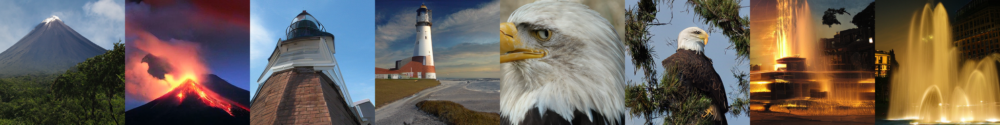

In [4]:
############################# 2. Sample with classifier-free guidance

# set args
import time
seed = 0 #@param {type:"number"}
torch.manual_seed(seed)
num_sampling_steps = 250 #@param {type:"slider", min:0, max:1000, step:1}
cfg = 4 #@param {type:"slider", min:1, max:10, step:0.1}
class_labels = (980, 980, 437, 437, 22, 22, 562, 562)  #@param {type:"raw"}
more_smooth = False # True for more smooth output

# seed
torch.manual_seed(seed)
random.seed(seed)
np.random.seed(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# run faster
tf32 = True
torch.backends.cudnn.allow_tf32 = bool(tf32)
torch.backends.cuda.matmul.allow_tf32 = bool(tf32)
torch.set_float32_matmul_precision('high' if tf32 else 'highest')

# sample
B = len(class_labels)
label_B: torch.LongTensor = torch.tensor(class_labels, device=device)

start = time.time()

with torch.inference_mode():
    with torch.autocast('cuda', enabled=True, dtype=torch.float16, cache_enabled=True):    # using bfloat16 can be faster
        recon_B3HW = var.autoregressive_infer_cfg(B=B, label_B=label_B, cfg=cfg, top_k=900, top_p=0.95, g_seed=seed, more_smooth=more_smooth)

elapsed = time.time() - start

# 保存整张grid
chw = torchvision.utils.make_grid(recon_B3HW, nrow=8, padding=0, pad_value=1.0)
chw = chw.permute(1, 2, 0).mul_(255).cpu().numpy()
chw = PImage.fromarray(chw.astype(np.uint8))

chw_path = OUT_DIR / f"grid_seed{seed}_cfg{cfg}_topk{900}_topp{0.95}_smooth{more_smooth}.png"
chw.save(chw_path)

print("saved to:",OUT_DIR)
print("time:",elapsed,"seconds")
chw.show()
display(chw)

In [5]:
# 保存单张图片
for i, img in enumerate(recon_B3HW):
    img_np = img.permute(1, 2, 0).mul(255).cpu().numpy().astype(np.uint8)
    img_pil = PImage.fromarray(img_np)

    img_path = OUT_DIR / f"sample_{i:02d}_class{class_labels[i]}_seed{seed}_cfg{cfg}.png"
    img_pil.save(img_path)

print("saved individual samples to:", OUT_DIR)


saved individual samples to: /content/var_repro/level1_official_sampling


In [6]:
import json

record = {
    "level": "level1_official_sampling",
    "model_depth": MODEL_DEPTH,
    "model": f"VAR-d{MODEL_DEPTH}",
    "vae": "vae_ch160v4096z32",
    "patch_nums": patch_nums,
    "seed": seed,
    "cfg": cfg,
    "top_k": 900,
    "top_p": 0.95,
    "more_smooth": more_smooth,
    "class_labels": list(class_labels),
    "num_images": B,
    "elapsed_seconds": elapsed,
    "grid_path": str(chw_path),
    "observation": "All target classes are recognizable. Volcano, lighthouse, bald eagle, and fountain samples are visually coherent under fixed sampling settings."
}

with open(OUT_DIR / "record.json", "w", encoding="utf-8") as f:
    json.dump(record, f, indent=2, ensure_ascii=False)

print("saved record:", OUT_DIR / "record.json")


saved record: /content/var_repro/level1_official_sampling/record.json


第二级

In [7]:
from pathlib import Path
import json,csv,time
import torch
import random
import numpy as np
import torchvision
import PIL.Image as PImage
from IPython.display import display

LEVEL2_DIR = Path("/content/var_repro/level2_sampling_ablation")
LEVEL2_DIR.mkdir(parents=True,exist_ok=True)

print("level2 output dir:",LEVEL2_DIR)

level2 output dir: /content/var_repro/level2_sampling_ablation


In [8]:
# 固定类别和 baseline参数
# 继续沿用第一级别的，保证可比较
class_labels = (980, 980, 437, 437, 22, 22, 562, 562)
B = len(class_labels)

baseline = {
    "seed": 0,
    "cfg": 4.0,
    "top_k": 900,
    "top_p": 0.95,
    "more_smooth": False,
}


In [9]:
# 定义实验组
# 每一组相对baseline 只改一个变量
settings = [
    {
        "exp_id": "00_baseline",
        "seed": 0,
        "cfg": 4.0,
        "top_k": 900,
        "top_p": 0.95,
        "more_smooth": False,
        "changed_variable": "none",
    },
    {
        "exp_id": "01_cfg_low",
        "seed": 0,
        "cfg": 1.5,
        "top_k": 900,
        "top_p": 0.95,
        "more_smooth": False,
        "changed_variable": "cfg: 4.0 -> 1.5",
    },
    {
        "exp_id": "02_cfg_high",
        "seed": 0,
        "cfg": 6.0,
        "top_k": 900,
        "top_p": 0.95,
        "more_smooth": False,
        "changed_variable": "cfg: 4.0 -> 6.0",
    },
    {
        "exp_id": "03_topk_low",
        "seed": 0,
        "cfg": 4.0,
        "top_k": 100,
        "top_p": 0.95,
        "more_smooth": False,
        "changed_variable": "top_k: 900 -> 100",
    },
    {
        "exp_id": "04_topp_low",
        "seed": 0,
        "cfg": 4.0,
        "top_k": 900,
        "top_p": 0.90,
        "more_smooth": False,
        "changed_variable": "top_p: 0.95 -> 0.90",
    },
    {
        "exp_id": "05_smooth",
        "seed": 0,
        "cfg": 4.0,
        "top_k": 900,
        "top_p": 0.95,
        "more_smooth": True,
        "changed_variable": "more_smooth: False -> True",
    },
]



Running 00_baseline...
saved: /content/var_repro/level2_sampling_ablation/00_baseline/00_baseline_grid_seed0_cfg4.0_topk900_topp0.95_smoothFalse.png
time: 0.5393674373626709 seconds


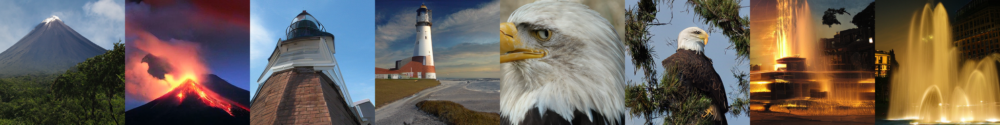


Running 01_cfg_low...
saved: /content/var_repro/level2_sampling_ablation/01_cfg_low/01_cfg_low_grid_seed0_cfg1.5_topk900_topp0.95_smoothFalse.png
time: 0.5015056133270264 seconds


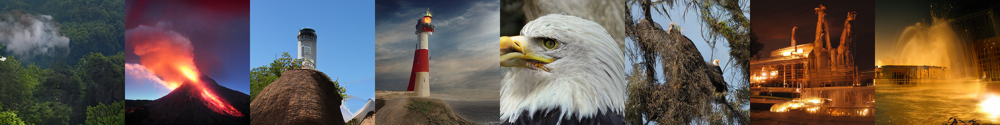


Running 02_cfg_high...
saved: /content/var_repro/level2_sampling_ablation/02_cfg_high/02_cfg_high_grid_seed0_cfg6.0_topk900_topp0.95_smoothFalse.png
time: 0.5073306560516357 seconds


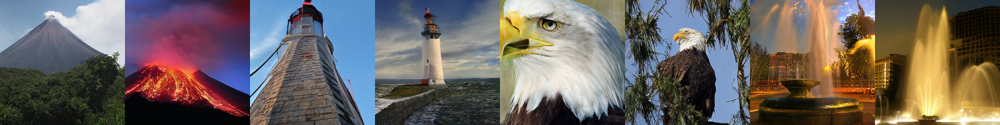


Running 03_topk_low...
saved: /content/var_repro/level2_sampling_ablation/03_topk_low/03_topk_low_grid_seed0_cfg4.0_topk100_topp0.95_smoothFalse.png
time: 0.502382755279541 seconds


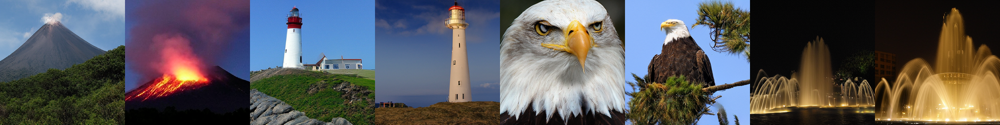


Running 04_topp_low...
saved: /content/var_repro/level2_sampling_ablation/04_topp_low/04_topp_low_grid_seed0_cfg4.0_topk900_topp0.9_smoothFalse.png
time: 0.5279433727264404 seconds


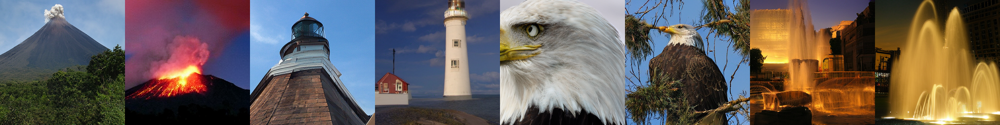


Running 05_smooth...
saved: /content/var_repro/level2_sampling_ablation/05_smooth/05_smooth_grid_seed0_cfg4.0_topk900_topp0.95_smoothTrue.png
time: 0.6206326484680176 seconds


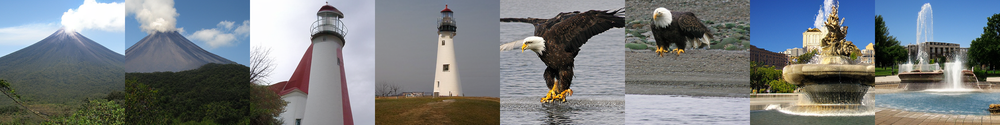

In [13]:
# 批量运行并保存结果
records = []
for s in settings:
  exp_id = s["exp_id"]
  seed = s["seed"]
  cfg = s["cfg"]
  top_k = s["top_k"]
  top_p = s["top_p"]
  more_smooth = s["more_smooth"]

  print(f"\nRunning {exp_id}...")

  torch.manual_seed(seed)
  random.seed(seed)
  np.random.seed(seed)

  label_B = torch.tensor(class_labels,device=device)

  start = time.time()

  with torch.inference_mode():
    with torch.autocast("cuda", enabled=True, dtype=torch.float16, cache_enabled=True):
      recon_B3HW = var.autoregressive_infer_cfg(
          B=B,
          label_B=label_B,
          cfg=cfg,
          top_k=top_k,
          top_p=top_p,
          g_seed=seed,
          more_smooth=more_smooth,
      )

  elapsed=time.time()-start

  exp_dir =LEVEL2_DIR/exp_id
  exp_dir.mkdir(parents=True, exist_ok=True)

  # 保存 grid
  grid = torchvision.utils.make_grid(
      recon_B3HW,
      nrow=8,
      padding=0,
      pad_value=1.0,
  )
  grid_np = grid.permute(1, 2, 0).mul(255).cpu().numpy().astype(np.uint8)
  grid_img = PImage.fromarray(grid_np)

  grid_path = exp_dir / f"{exp_id}_grid_seed{seed}_cfg{cfg}_topk{top_k}_topp{top_p}_smooth{more_smooth}.png"
  grid_img.save(grid_path)

  # 保存单张图
  for i, img in enumerate(recon_B3HW):
      img_np = img.permute(1, 2, 0).mul(255).cpu().numpy().astype(np.uint8)
      img_pil = PImage.fromarray(img_np)
      img_pil.save(exp_dir / f"sample_{i:02d}_class{class_labels[i]}_seed{seed}.png")

  record = {
      "exp_id": exp_id,
      "changed_variable": s["changed_variable"],
      "model": f"VAR-d{MODEL_DEPTH}",
      "seed": seed,
      "cfg": cfg,
      "top_k": top_k,
      "top_p": top_p,
      "more_smooth": more_smooth,
      "class_labels": list(class_labels),
      "elapsed_seconds": elapsed,
      "grid_path": str(grid_path),
      "observation": "",
  }
  with open(exp_dir / "record.json", "w", encoding="utf-8") as f:
    json.dump(record, f, indent=2, ensure_ascii=False)

  records.append(record)

  print("saved:", grid_path)
  print("time:", elapsed, "seconds")
  display(grid_img)



In [14]:
csv_path = LEVEL2_DIR / "summary.csv"

with open(csv_path, "w", newline="", encoding="utf-8") as f:
    writer = csv.DictWriter(
        f,
        fieldnames=[
            "exp_id",
            "changed_variable",
            "model",
            "seed",
            "cfg",
            "top_k",
            "top_p",
            "more_smooth",
            "elapsed_seconds",
            "grid_path",
            "observation",
        ],
    )
    writer.writeheader()

    for r in records:
        row = r.copy()
        row.pop("class_labels")
        writer.writerow(row)

print("saved summary:", csv_path)


saved summary: /content/var_repro/level2_sampling_ablation/summary.csv
